## Speech Emotion Recognition
By Shivam Burnwal on RAVDESS Kaggle
The following code uses deep learning to recognize emotions from data.
The specific use of this code in this project will be to analyze toxicity of speech in online video game environments.

Datasets:
Crowd-sourced Emotional Mutimodal Actors Dataset (Crema-D)
Ryerson Audio-Visual Database of Emotional Speech and Song (RAVDESS)
Surrey Audio-Visual Expressed Emotion (Savee)
Toronto emotional speech set (TESS)

In [2]:
# !pip install librosa seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 2.6 MB/s eta 0:00:00
  Using cached joblib-1.4.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached threadpoolctl-3.5.0-py3-none-any.whl.metadata (13 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.1/260.1 kB 6.0 MB/s eta 0:00:0000:01
Using cached joblib-1.4.2-py3-none-any.whl (301 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.4/81.4 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 3.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.6/64.6 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.0/11.0 MB 7.7 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.1/23.1 MB 10.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 10.1 MB/s eta 0:00:00 0:00:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.9/159.9 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.8/28.8 MB 3.6 MB/s e


* add more datasets

In [1]:
import pandas as pd
import numpy as np

import os
import sys

# librosa is a Python library for analyzing audio and music. It can be used to extract the data from the audio files we will see it later.
import librosa
import librosa.display
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

# to play the audio files
from IPython.display import Audio

import keras
from keras.callbacks import ReduceLROnPlateau
from keras.models import Sequential
from keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, Dropout, BatchNormalization
# from keras.utils import np_utils, to_categorical
from keras.callbacks import ModelCheckpoint

# import warnings
# if not sys.warnoptions:
#     warnings.simplefilter("ignore")
# warnings.filterwarnings("ignore", category=DeprecationWarning) 

#### np_utils, to_categorical is not imported !!

## Importing RAVDESS Data and Creating DataFrame

Filename identifiers as per the official RAVDESS website:

* Modality (01 = full-AV, 02 = video-only, 03 = audio-only).
* Vocal channel (01 = speech, 02 = song).
* Emotion (01 = neutral, 02 = calm, 03 = happy, 04 = sad, 05 = angry, 06 = fearful, 07 = disgust, 08 = surprised).
* Emotional intensity (01 = normal, 02 = strong). NOTE: There is no strong intensity for the 'neutral' emotion.
* Statement (01 = "Kids are talking by the door", 02 = "Dogs are sitting by the door").
* Repetition (01 = 1st repetition, 02 = 2nd repetition).
* Actor (01 to 24. Odd numbered actors are male, even numbered actors are female).

Ex. 02-01-06-01-02-01-12.mp4

Gives 192 audio clips of each emotion, except "neutral" which only has one repetition.

#### NOTE: only looking at emotion currently. Should also check modality, and look at emotional intensity, and vocal channel.

In [96]:
ravdess = "RAVDESS_actors_01-24/"
ravdess_actor_list = os.listdir(ravdess)

file_emotion = [] # collecting emotion value for each file
file_intensity = [] # collecting intensity value for each file
file_statement = []
file_repetition = []
file_actor = [] # collecting actor number for each file
file_path = [] # collecting directories to each file

if ".DS_Store" in ravdess_actor_list:
    ravdess_actor_list.remove(".DS_Store")

for dir in ravdess_actor_list: 
    # extracting files for each actor
    actor = os.listdir(ravdess + dir)
    for file in actor:
        part = file.split('.')[0]
        part = part.split('-')
        file_emotion.append(int(part[2])) # third code provides emotion for that file (also converting str to int)
        file_intensity.append(int(part[3]))
        file_statement.append(int(part[4]))
        file_repetition.append(int(part[5]))
        file_actor.append(int(part[6]))
        file_path.append(ravdess + dir + '/' + file)
        
# dataframe for RAVDESS emotions and file paths
ravdess_df = pd.DataFrame({'Actor':file_actor, 'Emotions':file_emotion, 'Intensity':file_intensity, 'Statement':file_statement, 
                           'Repetition':file_repetition, 'Path':file_path})

# changing integers to emotion names
ravdess_df.Emotions.replace({1:'neutral', 2:'calm', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'}, inplace=True)
ravdess_df.Intensity.replace({1: 'normal', 2:'strong'}, inplace=True)
ravdess_df

/var/folders/f5/b_cm3jsx1d7c35ykt1zbj7rm0000gn/T/ipykernel_9588/4026192933.py:32: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  ravdess_df.Emotions.replace({1:'neutral', 2:'calm', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'}, inplace=True)
/var/folders/f5/b_cm3jsx1d7c35ykt1zbj7rm0000gn/T/ipykernel_9588/4026192933.py:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace meth

,Actor,Emotions,Intensity,Statement,Repetition,Path
0,16,angry,normal,2,1,RAVDESS_actors_01-24/Actor_16/03-01-05-01-02-0...
1,16,fear,normal,2,2,RAVDESS_actors_01-24/Actor_16/03-01-06-01-02-0...
2,16,fear,strong,1,2,RAVDESS_actors_01-24/Actor_16/03-01-06-02-01-0...
3,16,angry,strong,1,1,RAVDESS_actors_01-24/Actor_16/03-01-05-02-01-0...
4,16,disgust,normal,1,1,RAVDESS_actors_01-24/Actor_16/03-01-07-01-01-0...
...,...,...,...,...,...,...
1435,8,happy,strong,2,2,RAVDESS_actors_01-24/Actor_08/03-01-03-02-02-0...
1436,8,happy,normal,1,2,RAVDESS_actors_01-24/Actor_08/03-01-03-01-01-0...
1437,8,calm,strong,1,1,RAVDESS_actors_01-24/Actor_08/03-01-02-02-01-0...
1438,8,calm,normal,2,1,RAVDESS_actors_01-24/Actor_08/03-01-02-01-02-0...


In [97]:
data_df = ravdess_df

## Data Visualization

* Waveplots - indicates loudness of audio over time
* Spectograms - spectrum of frequencies of sound/music signals as they vary with time

In [98]:
emotion = 'happy'
intensity = 'strong'
statement = 1
repetition = 1

original = np.array(data_df.Path[data_df.Emotions==emotion])[1]
path_normal = np.array(data_df.Path[(data_df.Emotions==emotion) & (data_df.Intensity=='normal') & (data_df.Statement==statement) & 
                (data_df.Repetition==repetition) & (data_df.Actor==16)])[0]
data, sr = librosa.load(path_normal)
original

'RAVDESS_actors_01-24/Actor_16/03-01-03-01-01-02-16.wav'

In [99]:
def create_waveplot(data_n, data_s, data_n0, sr_n, sr_s, sr_n0, e):
    plt.figure(figsize=(6, 5))
    plt.title('Waveplot for {} emotion'.format(e), size=15)
    plt.ylim(-0.5, 0.5)
    librosa.display.waveshow(data_s, sr=sr_s, color='b', alpha=0.5, label='strong intensity')
    librosa.display.waveshow(data_n, sr=sr_n, color='r', alpha=0.5, label='normal intensity')
    librosa.display.waveshow(data_n0, sr=sr_n0, color='g', alpha=0.5, label='neutral emotion')
    plt.legend()
    plt.savefig('data_visualization/waveplot_{}'.format(e))
    plt.show()

def create_spectrogram(data, sr, e):
    # stft function converts the data into short term fourier transform
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(6, 3))
    plt.title('Spectrogram for {} emotion'.format(e), size=15)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz', vmin=-60, vmax=40, cmap="viridis")
        # setting legend as -60 to 40
    #librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar()
    plt.savefig('data_visualization/spectrogram_{}'.format(e))

def create_plots(emotion, statement=1, repetition=1):
    path_normal = np.array(data_df.Path[(data_df.Emotions==emotion) & (data_df.Intensity=='normal') & (data_df.Statement==statement) & 
                (data_df.Repetition==repetition) & (data_df.Actor==16)])[0] # index 0 to take only string
    path_neutral = np.array(data_df.Path[(data_df.Emotions=='neutral') & (data_df.Statement==statement) & (data_df.Repetition==repetition) 
                            & (data_df.Actor==16)])[0]
    check_strong = np.array(data_df.Path[(data_df.Emotions==emotion) & (data_df.Intensity=='strong') & (data_df.Statement==statement) & 
            (data_df.Repetition==repetition) & (data_df.Actor==16)])
    path_strong = check_strong[0] if len(check_strong) > 0 else path_normal
    
    data_normal, sampling_rate_normal = librosa.load(path_normal)
    data_neutral, sampling_rate_neutral = librosa.load(path_neutral)
    if path_strong:
        data_strong, sampling_rate_strong = librosa.load(path_strong)
    
    waveplot = create_waveplot(data_normal, data_strong, data_neutral, sampling_rate_normal, sampling_rate_strong, sampling_rate_neutral, emotion)
    spectrogram = create_spectrogram(data_strong, sampling_rate_strong, emotion)
    display(Audio(path_normal))
    display(Audio(path_strong))
    print(path_strong)

Emotions: neutral, calm, happy, sad, angry, fear, disgust, surprise

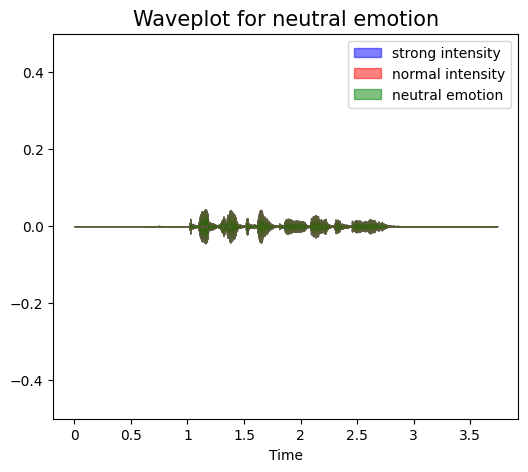

RAVDESS_actors_01-24/Actor_16/03-01-01-01-01-01-16.wav


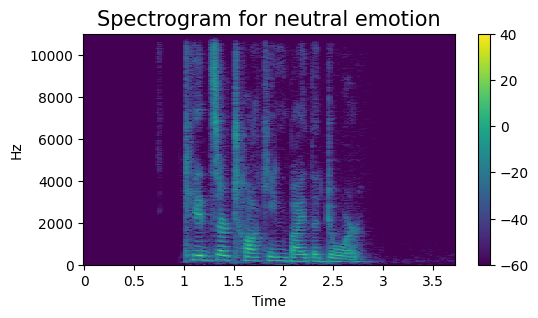

In [100]:
create_plots("neutral")

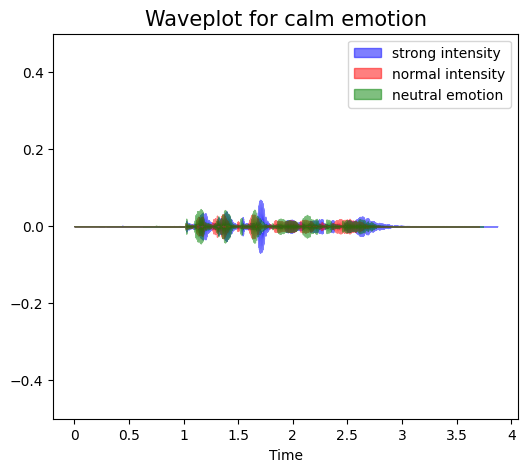

RAVDESS_actors_01-24/Actor_16/03-01-02-02-01-01-16.wav


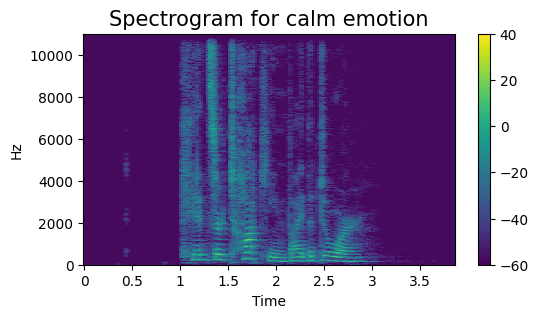

In [101]:
create_plots("calm")

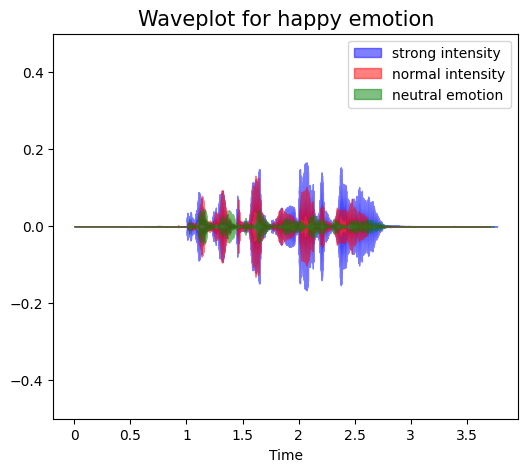

RAVDESS_actors_01-24/Actor_16/03-01-03-02-01-01-16.wav


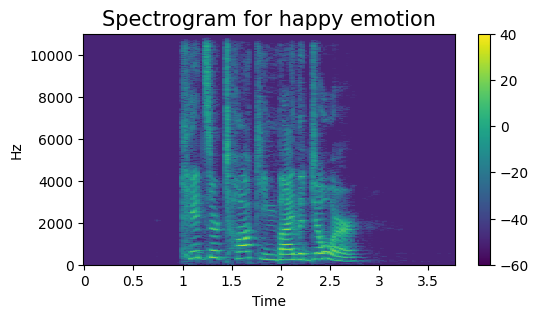

In [102]:
create_plots("happy")

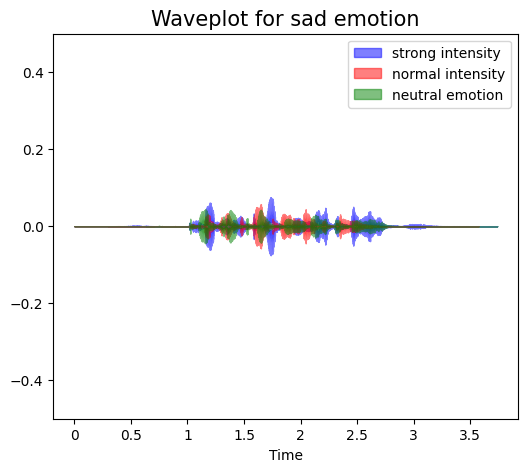

RAVDESS_actors_01-24/Actor_16/03-01-04-02-01-01-16.wav


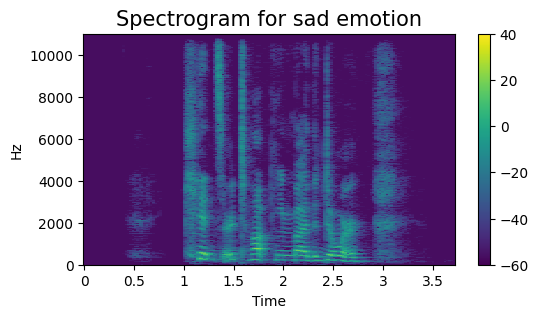

In [103]:
create_plots("sad")

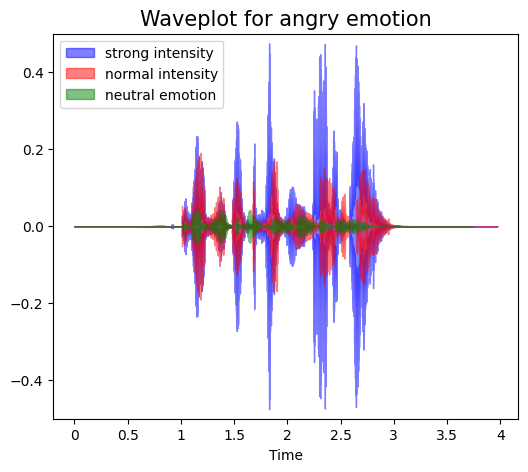

RAVDESS_actors_01-24/Actor_16/03-01-05-02-01-01-16.wav


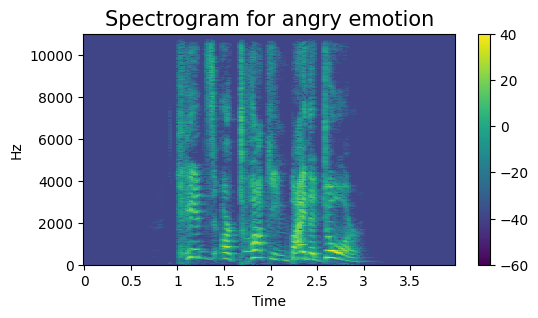

In [104]:
create_plots("angry")

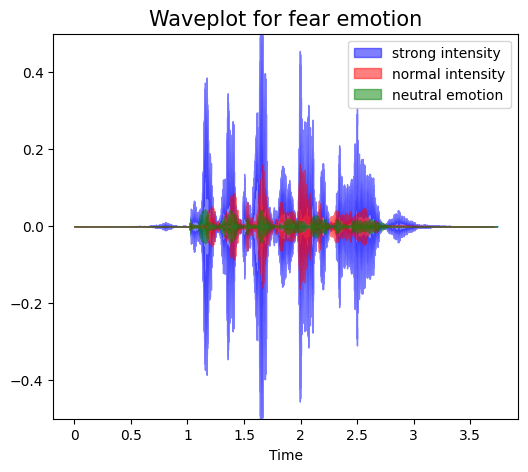

RAVDESS_actors_01-24/Actor_16/03-01-06-02-01-01-16.wav


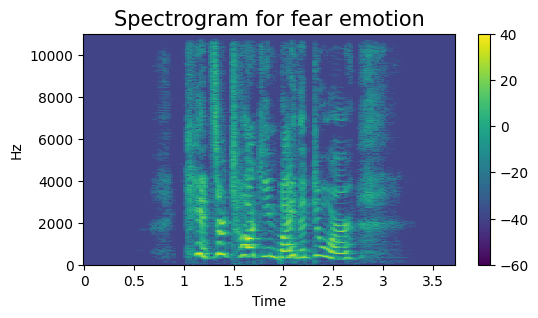

In [105]:
create_plots("fear")

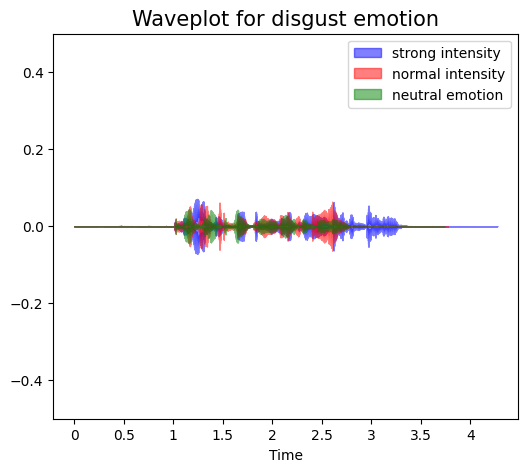

RAVDESS_actors_01-24/Actor_16/03-01-07-02-01-01-16.wav


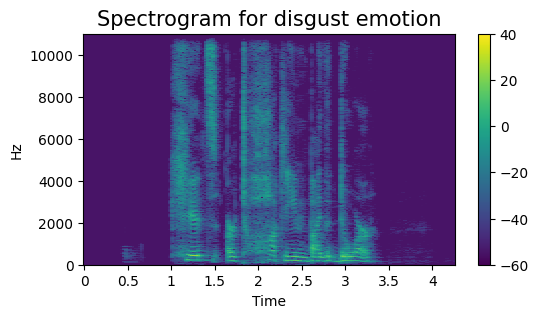

In [106]:
create_plots("disgust")

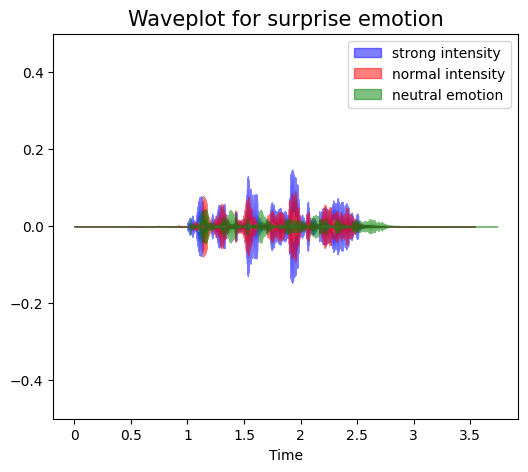

RAVDESS_actors_01-24/Actor_16/03-01-08-02-01-01-16.wav


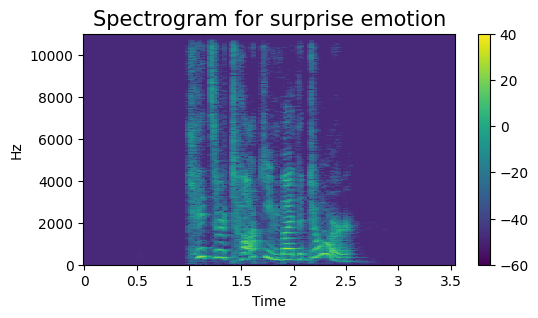

In [107]:
create_plots("surprise")

## Data Augmentation
- Creating new synthetic data samples by adding small perturbations on our initial training set.
- To generate syntactic data for audio, we can apply noise injection, shifting time, changing pitch and speed.
- The objective is to make our model invariant to those perturbations and enhace its ability to generalize.
- In order to this to work adding the perturbations must conserve the same label as the original training sample.
- In images data augmention can be performed by shifting the image, zooming, rotating ...

In [108]:
# adds random Gaussian noise to audio signal to simulate background noise
def noise(data): 
    # Gaussian more ideal for continuous audio data
    # random value between 0-1 and scales noise to max amp of data * 0.035 intensity
    # 0.035 is empirically derived value, gives good SNR and prevents overfitting
    noise_amp = 0.035*np.random.uniform()*np.amax(data)    
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

# introduces variability in speech rate, reducing speed to 80%
def stretch(data, speed_rate=0.8):
    return librosa.effects.time_stretch(data, rate=speed_rate)

# shift audio backward or forward by random amount. simulates temporal invariance, i.e. delayed starts
def shift(data):
    shift_range = int(np.random.uniform(low=-5, high = 5)*1000) # random shift between -5000 to 5000
    return np.roll(data, shift_range) # circularly shifts array

# changes pitch to simulate vocal ranges
def pitch(data, sampling_rate, pitch_factor=0.7): # shifted upwards by 0.7 semitones
    # pitch_factor = np.random.uniform(-2, 2) # if you want to introduce randomness
    return librosa.effects.pitch_shift(data, sr=sampling_rate, n_steps=pitch_factor)

### Visualization

In [109]:
path = np.array(data_df.Path)[1]
data, sample_rate = librosa.load(path)

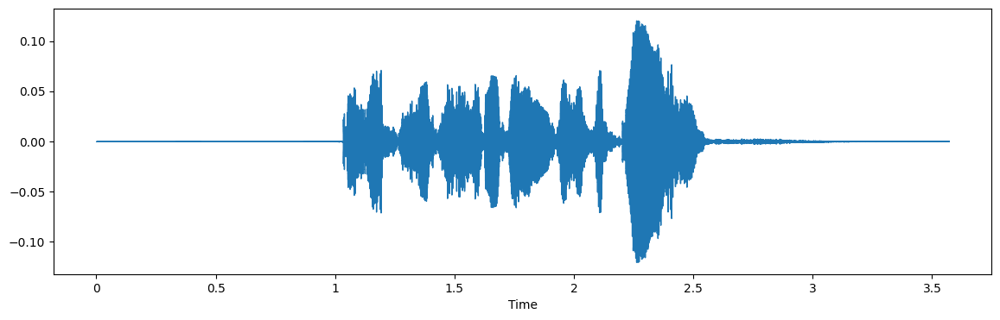

In [110]:
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=data, sr=sample_rate)
Audio(path)

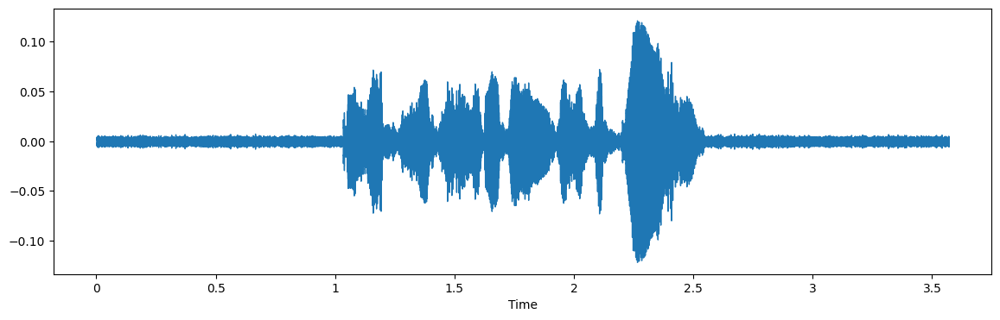

In [111]:
x = noise(data)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

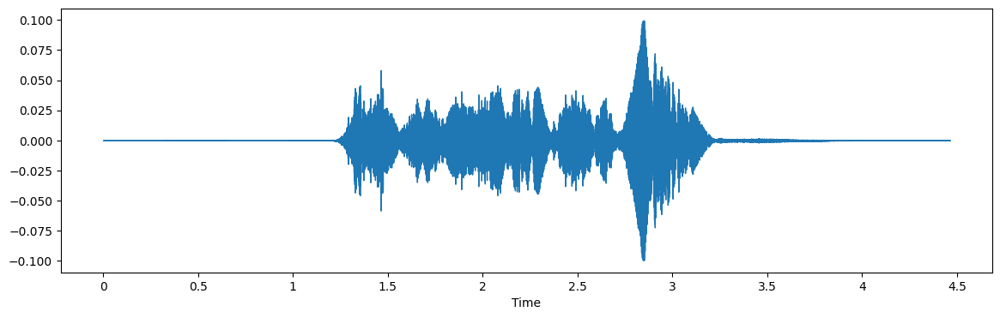

In [112]:
x = stretch(data)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x)
Audio(x, rate=sample_rate)

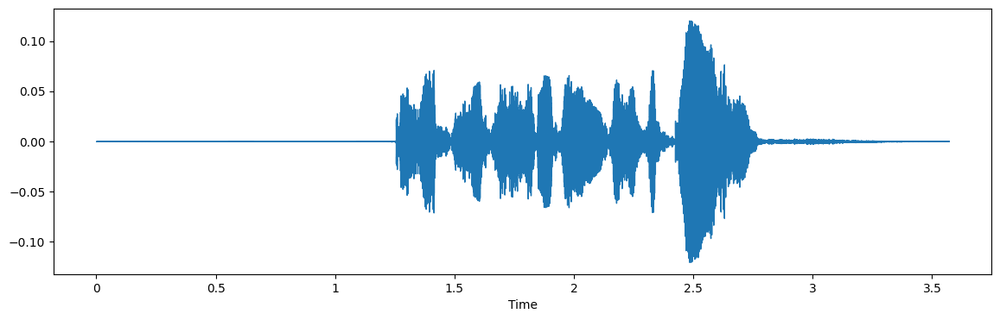

In [113]:
x = shift(data)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

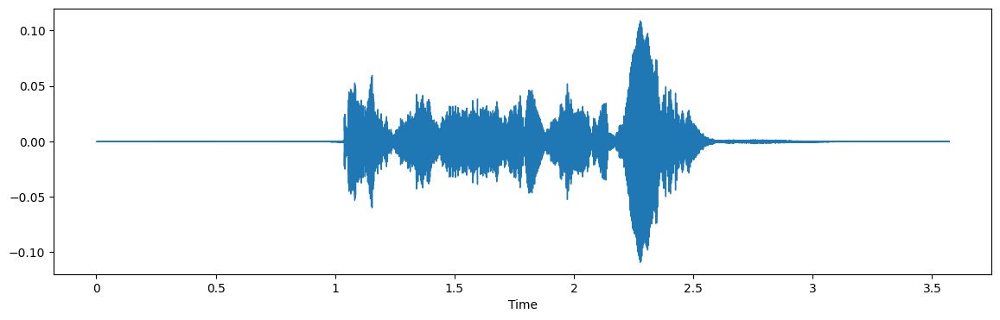

In [114]:
x = pitch(data, sample_rate)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

## Feature Extraction


With sample rate and sample data, the following transformations can be used to extract valuable features:

* Zero Crossing Rate: The rate of sign-changes of the signal during the duration of a particular frame. 
* Energy: The sum of squares of the signal values, normalized by the respective frame length.
* Entropy of Energy: The entropy of sub-frames’ normalized energies. It can be interpreted as a measure of abrupt changes.
* Spectral Centroid: The center of gravity of the spectrum.
* Spectral Spread: The second central moment of the spectrum.
* Spectral Entropy: Entropy of the normalized spectral energies for a set of sub-frames.
* Spectral Flux: The squared difference between the normalized magnitudes of the spectra of the two successive frames.
* Spectral Rolloff: The frequency below which 90% of the magnitude distribution of the spectrum is concentrated.
* MFCCs Mel Frequency Cepstral Coefficients form a cepstral representation where the frequency bands are not linear but distributed according to the mel-scale.
* Chroma Vector: A 12-element representation of the spectral energy where the bins represent the 12 equal-tempered pitch classes of western-type music (semitone spacing).
* Chroma Deviation: The standard deviation of the 12 chroma coefficients.

The following code only uses these 5 features:
* Zero Crossing Rate: gives tonal or percussive audio
* Chroma_stft: chroma of short-term fourier transform indicates pitch classes
* MFCC: captures spectral properties
* RMS (root mean square) value: signal amplitude energy
* MelSpectogram: power over mel-scale frequencies

NOTE: more features should be analyzed to determine which features would prove most effective and informative for this thesis.

In [115]:
def extract_features(data):
    """ original uses ZCR, chroma_stft, MFCC, RMS, and MelSpectrogram
        features placed in order of importance
    
    """
    
    result = np.array([])

    # MFCC
    # NOTE: be aware that means are being taken, and how that might affect accuracy
    mfcc = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mfcc))

    # Root Mean Square Value (Energy)
    rms = np.mean(librosa.feature.rms(y=data).T, axis=0)
    result = np.hstack((result, rms))

    # (new) Entropy of Energy
    # separate energy into frames
    frame_energies = librosa.feature.rms(y=data, frame_length=2048, hop_length=512)[0]
    # normalize energy levels across frames to create probability distribution
    probabilities = frame_energies / np.sum(frame_energies + 1e-10) # 1e-10 prevents division by 0
    # using Shannon Entropy formula, measures eveness of energy across frames
    entropy_of_energy = -np.sum(probabilities * np.log2(probabilities + 1e-10))
    result = np.hstack((result, entropy_of_energy))

    # (new) Spectral Centroid
    spectral_centroid = np.mean(librosa.feature.spectral_centroid(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, spectral_centroid))
    
    # (new) Spectral Flux
    # Librosa: librosa.onset.onset_strength "computes a spectral flux onset strength envelope"
    spectral_flux = np.mean(librosa.onset.onset_strength(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, spectral_flux))

    # Zero Crossing Rate
    zcr = np.mean(librosa.feature.zero_crossing_rate(y=data).T, axis=0)
    result=np.hstack((result, zcr)) # stacking horizontally

    # MelSpectogram
    mel = np.mean(librosa.feature.melspectrogram(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mel))

    # (new) Spectral Spread
    # calculates the weighted variance of the frequency components 
    spectral_spread = np.mean(librosa.feature.spectral_bandwidth(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, spectral_spread))


    # # Chroma_stft
    # stft = np.abs(librosa.stft(data))
    # chroma_stft = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T, axis=0)
    # result = np.hstack((result, chroma_stft))
    
    return result

def get_features(path):
    # duration and offset take care of no audio in start and end of each audio file
    data, sample_rate = librosa.load(path, duration=2.5, offset=0.6)
    
    # without augmentation
    res1 = extract_features(data)
    result = np.array(res1)
    
    # data with noise, stretching and pitching
    noise_data = noise(data)
    res2 = extract_features(noise_data)
    result = np.vstack((result, res2)) # stacking vertically
    
    new_data = stretch(data) ######
    data_stretch_pitch = pitch(new_data, sample_rate)
    res3 = extract_features(data_stretch_pitch)
    result = np.vstack((result, res3))
    
    return result

In [116]:
librosa.feature.zero_crossing_rate(y=data)

array([[0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.09375   , 0.31640625,
        0.41064453, 0.48339844, 0.38916016, 0.16650391, 0.07226562,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.03369141, 0.25537109, 0.47705078, 0.70458984,
        0.87255859, 0.74658203, 0.62255859, 0.48535156, 0.30029297,
        0.21630859, 0.13085938, 0.05712891, 0.06103516, 0.06640625,
        0.06835938, 0.0625    , 0.04833984, 0.09277344, 0.26025391,
        0.41894531, 0.50585938, 0.453125  , 0.28466797, 0.13671875,
        0.06689453, 0.16015625, 0.31787109, 0.48828125, 0.66552734,
        0.75585938, 0.77441406, 0.76171875, 0.69921875, 0.51855469,
        0.34423828, 0.17773438, 0.04785156, 0.06

In [117]:
X, Y = [], []
for path, emotion in zip(data_df.Path, data_df.Emotions):
    feature = get_features(path)
    for element in feature:
        X.append(element)
        # appending emotion 3 times as we have made 3 augmentation techniques on each audio file.
        Y.append(emotion)

In [118]:
len(X), len(Y), data_df.Path.shape, X[0]

(4320,
 4320,
 (1440,),
 array([-4.40286560e+02,  5.22992973e+01, -6.66586542e+00,  4.27829981e+00,
        -1.58083200e+01, -9.86963558e+00, -1.39568014e+01, -1.83278408e+01,
        -1.85236912e+01, -2.28567100e+00, -1.15728636e+01, -9.50705147e+00,
        -5.05675268e+00, -8.62557983e+00, -9.51268101e+00, -8.53108311e+00,
        -3.47315693e+00, -1.07509241e+01, -9.17201614e+00, -3.56154585e+00,
         1.87931694e-02,  6.11912203e+00,  3.15936012e+03,  2.35188270e+00,
         2.04540111e-01,  2.96436901e-05,  1.43476238e-04,  2.35340398e-04,
         2.12330066e-04,  1.42069103e-03,  2.37757005e-02,  6.60269782e-02,
         4.01791543e-01,  8.08837056e-01,  2.03561440e-01,  1.86625212e-01,
         6.17747843e-01,  2.81589657e-01,  1.22361489e-01,  1.19159319e-01,
         4.24201727e-01,  7.26206064e-01,  6.22509122e-01,  6.22200072e-01,
         2.45160133e-01,  1.97616607e-01,  4.78334695e-01,  8.08647215e-01,
         7.45410204e-01,  2.12027550e-01,  3.40871215e-01,  3.92

In [120]:
# sns.boxplot(x='labels', y=5, data=Features)
# plt.title('_ Feature by Emotion')
# plt.show()

In [121]:
Features = pd.DataFrame(X)
Features['labels'] = Y
Features.to_csv('features.csv', index=False)
Features.head()

,0,1,2,3,4,5,6,7,8,9,...,145,146,147,148,149,150,151,152,153,labels
0,-440.286560,52.299297,-6.665865,4.278300,-15.808320,-9.869636,-13.956801,-18.327841,-18.523691,-2.285671,...,0.004037,0.004855,0.004624,0.005723,0.006007,0.006103,0.005150,0.000251,2215.383804,angry
1,-435.397252,50.739626,-6.466028,3.847792,-15.896497,-10.274715,-13.565199,-18.335347,-18.242665,-2.294910,...,0.004033,0.004856,0.004626,0.005723,0.006003,0.006102,0.005151,0.000251,2359.113232,angry
2,-486.249756,49.202705,-9.870458,-1.774760,-20.109116,-11.819500,-17.533779,-22.587418,-18.036371,-0.566133,...,0.001973,0.000855,0.000920,0.001194,0.000980,0.001365,0.000594,0.000053,2302.698091,angry
3,-484.020660,52.436253,-8.613781,6.417566,-3.227552,-13.682243,-20.474316,-20.309654,-12.173645,0.974064,...,0.002952,0.003851,0.003154,0.002964,0.002586,0.002761,0.001653,0.000115,1983.843756,fear
4,-320.442250,18.760780,7.974272,-0.125579,-1.597332,-7.638414,-10.934664,-8.967647,-6.574953,-3.371758,...,0.003633,0.004549,0.003855,0.003661,0.003453,0.003477,0.002361,0.000886,3142.498617,fear


In [122]:
X = Features.iloc[: ,:-1].values # data
Y = Features['labels'].values # emotions

X,Y

(array([[-4.40286560e+02,  5.22992973e+01, -6.66586542e+00, ...,
          5.15012816e-03,  2.50506971e-04,  2.21538380e+03],
        [-4.35397252e+02,  5.07396255e+01, -6.46602838e+00, ...,
          5.15112913e-03,  2.50818533e-04,  2.35911323e+03],
        [-4.86249756e+02,  4.92027054e+01, -9.87045765e+00, ...,
          5.93501434e-04,  5.27161756e-05,  2.30269809e+03],
        ...,
        [-6.10549255e+02,  8.06864090e+01,  3.94290328e+00, ...,
          1.17051586e-05,  8.04189540e-07,  2.38766237e+03],
        [-5.35391610e+02,  5.06551802e+01,  4.53735788e+00, ...,
          1.36252259e-05,  2.78829851e-06,  2.74634181e+03],
        [-6.61545715e+02,  7.54766006e+01,  1.19922352e+00, ...,
          4.89531840e-06,  3.54334276e-07,  2.41158807e+03]]),
 array(['angry', 'angry', 'angry', ..., 'neutral', 'neutral', 'neutral'],
       dtype=object))

In [123]:
# As this is a multiclass classification problem, onehotencoding Y
# encoder = OneHotEncoder(categories=[['neutral', 'calm', 'happy', 'sad', 'angry', 'fear', 'disgust', 'surprise']])
# encoder = OneHotEncoder()
# Y = OneHotEncoder().fit_transform(np.array(Y).reshape(-1,1)).toarray()

encoder = OneHotEncoder()
Y = encoder.fit_transform(np.array(Y).reshape(-1,1)).toarray()
Y

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.]])

In [124]:
# splitting data
x_train, x_test, y_train, y_test = train_test_split(X, Y, random_state=0, shuffle=True) # random_state = 0 for reproducibility
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((3240, 154), (3240, 8), (1080, 154), (1080, 8))

In [125]:
# scaling data (standardizes features by removing the mean and scaling to unit variance)
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((3240, 154), (3240, 8), (1080, 154), (1080, 8))

In [126]:
# making our data compatible to model.
x_train = np.expand_dims(x_train, axis=2)
x_test = np.expand_dims(x_test, axis=2)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((3240, 154, 1), (3240, 8), (1080, 154, 1), (1080, 8))

## Model

In [127]:
model=Sequential()
model.add(Conv1D(256, kernel_size=5, strides=1, padding='same', activation='relu', input_shape=(x_train.shape[1], 1)))
model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

model.add(Conv1D(256, kernel_size=5, strides=1, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

model.add(Conv1D(128, kernel_size=5, strides=1, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))
model.add(Dropout(0.2))

model.add(Conv1D(64, kernel_size=5, strides=1, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

model.add(Flatten())
model.add(Dense(units=32, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(units=8, activation='softmax'))
model.compile(optimizer = 'adam' , loss = 'categorical_crossentropy' , metrics = ['accuracy'])

model.summary()

/Users/jessicapatel/Desktop/Summer_2024/CommentToxicity/CTvenv/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_8 (Conv1D)               │ (None, 154, 256)       │         1,536 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_8 (MaxPooling1D)  │ (None, 77, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_9 (Conv1D)               │ (None, 77, 256)        │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_9 (MaxPooling1D)  │ (None, 39, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_10 (Conv1D)              │ (None, 39, 128)        │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_10 (MaxPooling1D) │ (None, 20, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 20, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_11 (Conv1D)              │ (None, 20, 64)         │        41,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_11 (MaxPooling1D) │ (None, 10, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 640)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │        20,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 8)              │           264 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 555,240 (2.12 MB)

 Trainable params: 555,240 (2.12 MB)

 Non-trainable params: 0 (0.00 B)

In [128]:
rlrp = ReduceLROnPlateau(monitor='loss', factor=0.4, verbose=0, patience=2, min_lr=0.0000001)
# ReduceLROnPlateau callback in Keras: adjusts learning rate during training
# it monitors loss and reduces learning rate by 0.4 (and won't go below 0.0000001) if loss doesn't improve for 2 epochs

epoch = 50
history=model.fit(x_train, y_train, batch_size=64, epochs=epoch, validation_data=(x_test, y_test), callbacks=[rlrp])
# includes monitoring of validation performance on x_test and y_test

Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - accuracy: 0.1760 - loss: 2.0385 - val_accuracy: 0.2111 - val_loss: 1.9407 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.2101 - loss: 1.9319 - val_accuracy: 0.2620 - val_loss: 1.8667 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.2631 - loss: 1.8690 - val_accuracy: 0.3102 - val_loss: 1.8093 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.2840 - loss: 1.8157 - val_accuracy: 0.3370 - val_loss: 1.7573 - learning_rate: 0.0010
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.3110 - loss: 1.7937 - val_accuracy: 0.3463 - val_loss: 1.7105 - learning_rate: 0.0010
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.3401 - loss: 1.7161 - val_accuracy: 0.3731 - val_loss: 1.7041 - learning_rate: 0.0010
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.3532 - loss: 1.6799 - val_acc

In [129]:
model.save("addedfeatures_RAVDESSonly.keras")

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6567 - loss: 1.3223
Accuracy on test data :  66.66666865348816 %


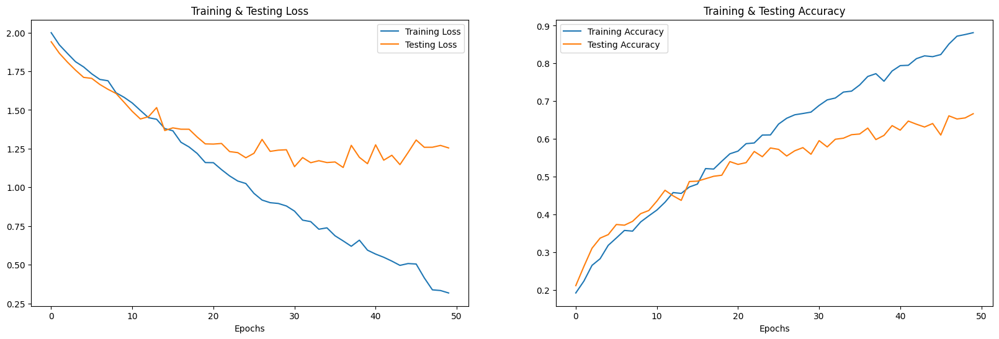

<Figure size 640x480 with 0 Axes>

In [130]:
print("Accuracy on test data : " , model.evaluate(x_test,y_test)[1]*100 , "%")

epochs = [i for i in range(50)]
fig , ax = plt.subplots(1,2)
train_acc = history.history['accuracy']
train_loss = history.history['loss']
test_acc = history.history['val_accuracy']
test_loss = history.history['val_loss']

fig.set_size_inches(20,6)
ax[0].plot(epochs , train_loss , label = 'Training Loss')
ax[0].plot(epochs , test_loss , label = 'Testing Loss')
ax[0].set_title('Training & Testing Loss')
ax[0].legend()
ax[0].set_xlabel("Epochs")

ax[1].plot(epochs , train_acc , label = 'Training Accuracy')
ax[1].plot(epochs , test_acc , label = 'Testing Accuracy')
ax[1].set_title('Training & Testing Accuracy')
ax[1].legend()
ax[1].set_xlabel("Epochs")
plt.savefig("loss_addedfeatures_RAVDESSonly.png")
plt.show()

In [131]:
# predicting on test data and convert back to original form
pred_test = model.predict(x_test)
y_pred = encoder.inverse_transform(pred_test)

y_test = encoder.inverse_transform(y_test)

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


In [132]:
df = pd.DataFrame(columns=['Predicted Labels', 'Actual Labels'])
df['Predicted Labels'] = y_pred.flatten()
df['Actual Labels'] = y_test.flatten()

df.head(10)

,Predicted Labels,Actual Labels
0,fear,fear
1,fear,sad
2,angry,angry
3,happy,happy
4,happy,happy
5,sad,fear
6,sad,fear
7,happy,happy
8,sad,sad
9,fear,fear


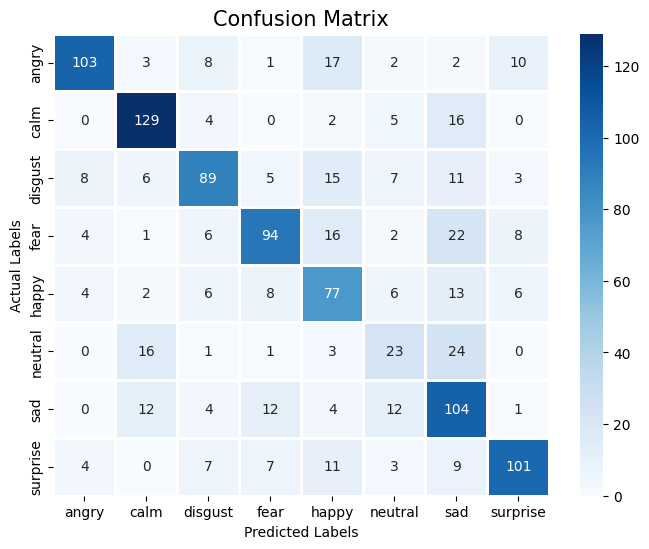

<Figure size 640x480 with 0 Axes>

In [133]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize = (8, 6))
cm = pd.DataFrame(cm , index = [i for i in encoder.categories_] , columns = [i for i in encoder.categories_])
sns.heatmap(cm, linecolor='white', cmap='Blues', linewidth=1, annot=True, fmt='')
plt.title('Confusion Matrix', size=15)
plt.xlabel('Predicted Labels', size=10)
plt.ylabel('Actual Labels', size=10)
plt.savefig("confmatrix_addedfeatures_RAVDESSonly.png")
plt.show()

In [38]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       angry       0.77      0.65      0.71       146
        calm       0.70      0.78      0.74       156
     disgust       0.60      0.58      0.59       144
        fear       0.73      0.64      0.68       153
       happy       0.52      0.64      0.57       122
     neutral       0.33      0.38      0.35        68
         sad       0.54      0.58      0.56       149
    surprise       0.83      0.68      0.75       142

    accuracy                           0.64      1080
   macro avg       0.63      0.62      0.62      1080
weighted avg       0.65      0.64      0.64      1080



In [134]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       angry       0.84      0.71      0.77       146
        calm       0.76      0.83      0.79       156
     disgust       0.71      0.62      0.66       144
        fear       0.73      0.61      0.67       153
       happy       0.53      0.63      0.58       122
     neutral       0.38      0.34      0.36        68
         sad       0.52      0.70      0.59       149
    surprise       0.78      0.71      0.75       142

    accuracy                           0.67      1080
   macro avg       0.66      0.64      0.65      1080
weighted avg       0.68      0.67      0.67      1080



In [ ]:
model = keras.models.load_model('modelname.keras')

---
### To-Do:
* add more data! 3 other Jess found, and Yun found
* read into the other audio features that can be used and determine if we should use them
* train for more epochs
* add evaluation of intensity in model
* add STT code to input a real-time speech function to test the model
* try testing on real game voice-chat samples (Twitch, YouTube)
* determining which of these emotions actually indicate toxicity

Later on:
* complete any refinements on text toxicity model
* integrate audio toxicity model with text toxicity model